In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
from sklearn.model_selection import train_test_split
import xgboost as xgb

from eda_tools.graphs.discrete_feature_binary_target import bar, bar_numerical
from eda_tools.graphs.continuous_feature_binary_target import histogram, probability_density_function
from eda_tools.graphs.two_discrete_features_binary_target import marimekko, barchart_100_percent
from eda_tools.probability_distribution import ProbabilityDistribution

pyo.init_notebook_mode()

# Load data

In [2]:
df = pd.read_csv("term-deposit-marketing-2020.csv")

In [3]:
df.shape

(40000, 14)

In [4]:
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,no


For convenience, we will convert the target variable to boolean type. First let's check that there are only two values:

In [5]:
df.y.unique()

array(['no', 'yes'], dtype=object)

In [6]:
df.y = df.y == "yes"

In [9]:
df.y.mean()

0.0724

# Feature explorations

## Age

There are no null values

In [10]:
pd.isnull(X.age).any()

False

Now we see in the age distribution that most people are between 25 and 60 years. Then, there is a sudden drop, probably because the bank considers that people with more than 60 years are not interested in the product.

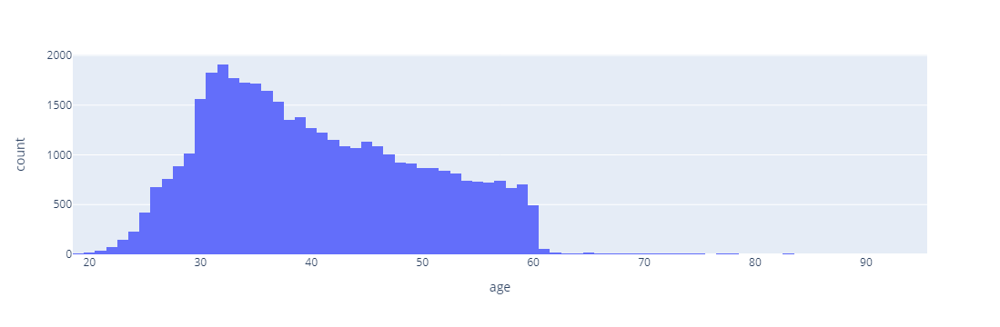

In [11]:
px.histogram(X, x="age")

We can see the relation between this variable and the target in the next graph:

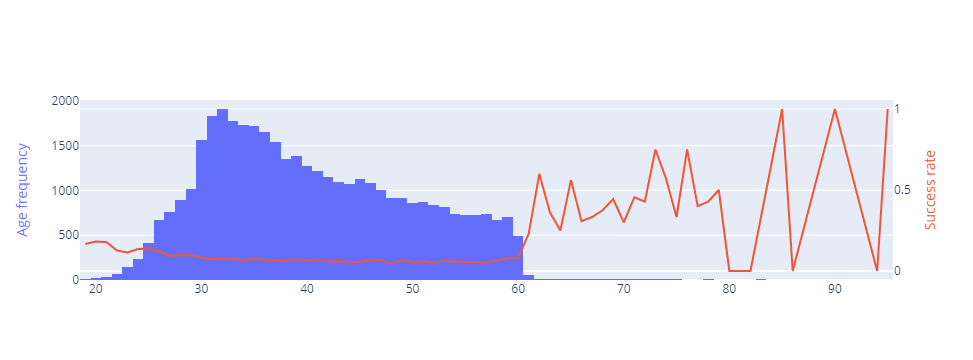

In [12]:
success_rate = df.groupby(by="age")["y"].mean()

go.Figure(
    data=[
        go.Histogram(x=df.age, yaxis="y", showlegend=False),
        go.Scatter(x=success_rate.index, y=success_rate, yaxis="y2", showlegend=False),
    ],
    layout=go.Layout(
        yaxis=dict(
            title="Age frequency",
            titlefont=dict(
                color=px.colors.qualitative.Plotly[0]
            ),
            side="left"
        ),
        yaxis2=dict(
            title="Success rate",
            anchor="x",
            overlaying="y",
            side="right",
            titlefont=dict(
                color=px.colors.qualitative.Plotly[1]
            ),
        ),
    )
)


We should not pay much attention to the success rate from 60 years onwards, since the amount of people in that range is actually very low and there will be of course a lot of noise. Maybe a better way of visualizing this without the noise is to discretize the samples in groups with the same number of people, this is, what remains constant is the quantiles, not the age interval:

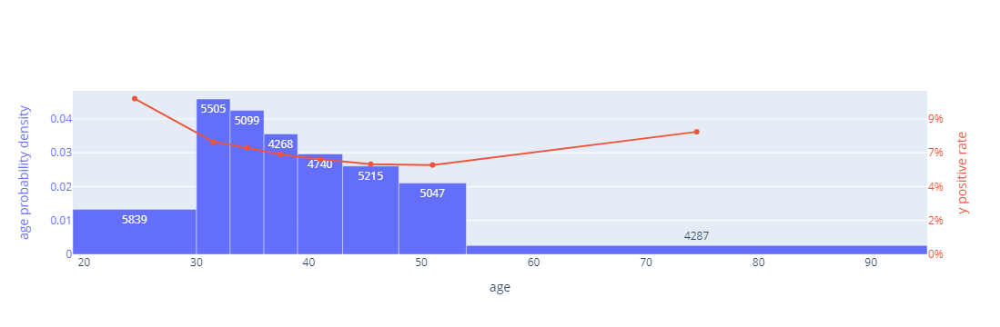

In [13]:
histogram(df, "age", "y", keep_group_size_constant=True)

## Job

There are not null values:

In [14]:
df.job.unique()

array(['management', 'technician', 'entrepreneur', 'blue-collar',
       'unknown', 'retired', 'admin', 'services', 'self-employed',
       'unemployed', 'housemaid', 'student'], dtype=object)

When we represent the amount of people in each category and the success rate among them we see this:

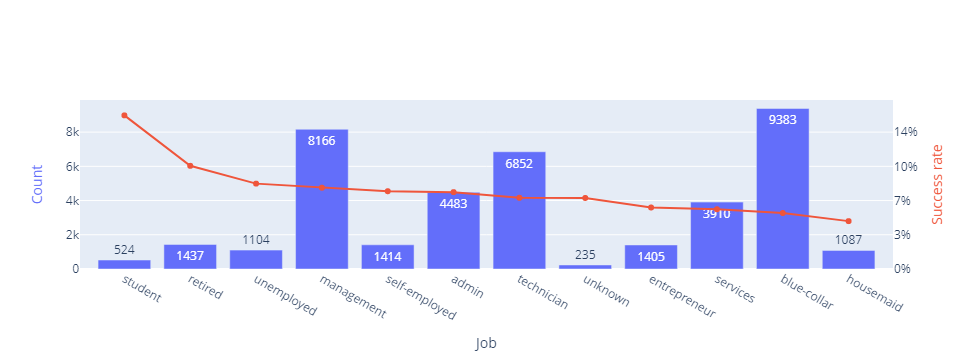

In [15]:
bar(df.job, df.y, feature_name="Job", target_average_name="Success rate")

We can see there are two really interesting categories: retired and student. Bot have higher success rates than the rest. This goes in consonance with what we indeed saw in previous graph by age, where they were the young and the old the ones with a higher success rate. We can represent both together:

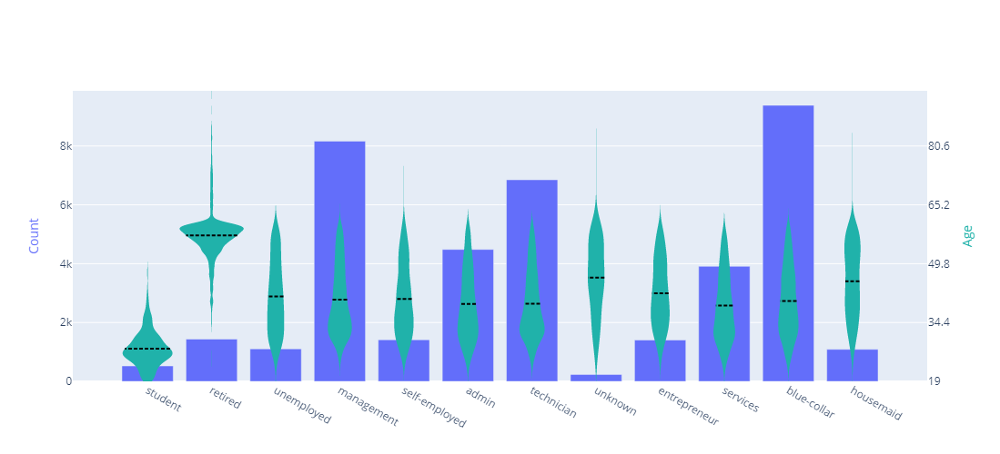

In [16]:
df_grouped = df.groupby(by=["job"]).aggregate(
    freq=pd.NamedAgg("y", "count"),
    success_rate=pd.NamedAgg("y", "mean")
).reset_index().sort_values("success_rate", ascending=False)

job_order = df_grouped.job

go.Figure(
    data=[
        go.Bar(
            x=df_grouped.job,
            y=df_grouped.freq,
            name="Count",
            yaxis="y",
            showlegend=False,
        ),
        go.Violin(
            x=df_train.job,
            y=df_train.age,
            width=1,
            fillcolor='lightseagreen',
            line_width=0,
            meanline = dict(color="black", width=2),
            points=False,
            showlegend=False,
            yaxis="y2",
        )
    ],
    layout=go.Layout(
        yaxis=dict(
            title="Count",
            titlefont=dict(
                color=px.colors.qualitative.Plotly[0]
            ),
            side="left"
        ),
        yaxis2=dict(
            title="Age",
            anchor="x",
            overlaying="y",
            side="right",
            titlefont_color="lightseagreen",
            tickmode="sync",
            range=[df_train.age.min(), df_train.age.max()]
        ),
        height=500
    )
)

## Marital

In [17]:
df.marital.unique()

array(['married', 'single', 'divorced'], dtype=object)

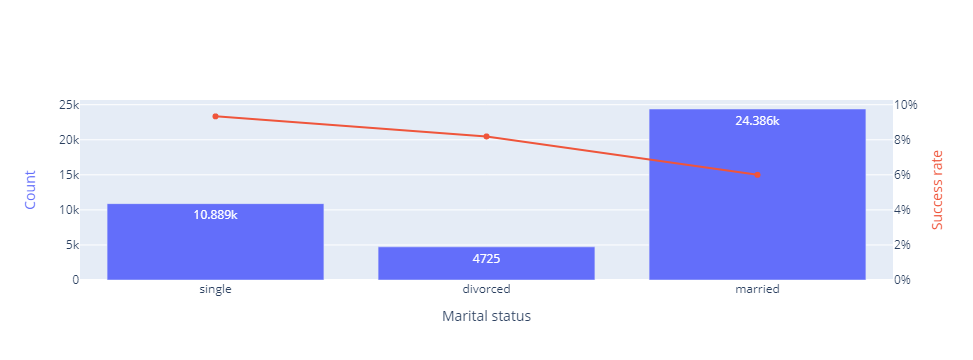

In [18]:
bar(df.marital, df.y, feature_name="Marital status", target_average_name="Success rate")

In [19]:
marital_order = df.groupby("marital").y.mean().sort_values(ascending=False).index

We see that the success rate among singles is the highest one, whereas it is the lowest one among married people. This might be because in marriages there is less opportunity to save money, and it is harder to arrive to an agreement with the partner about money.

We can try to see some relationship with the jobs these tree groups have

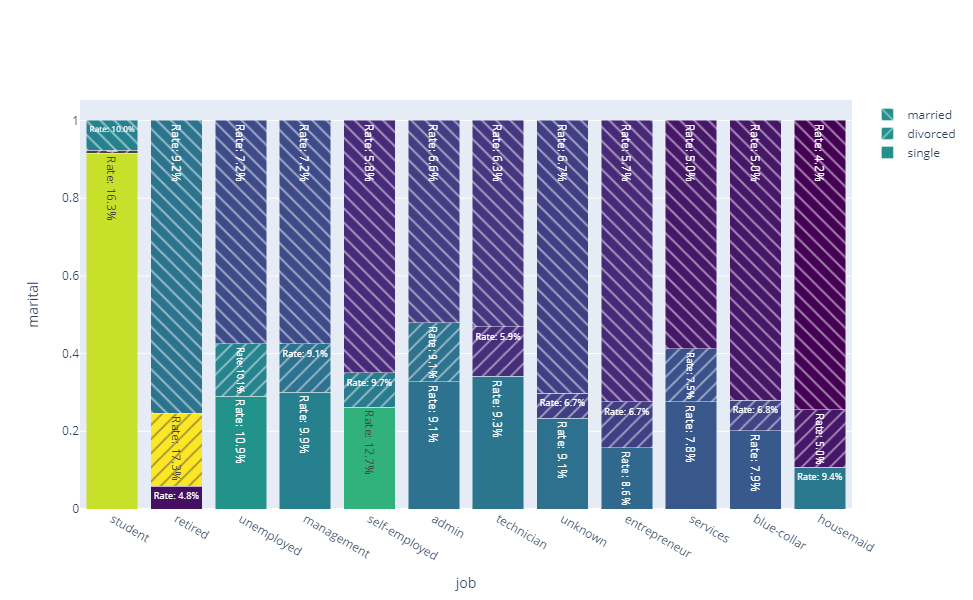

In [20]:
barchart_100_percent(df.job, df.marital, df.y)

Indeed we find that both the job and the marital state are relevant. We could have just found that only one of them matters, and that the other is conditionally independent with the target. But this is not the case. It seems both variables matter in order to predict the target.

## Education

In [21]:
df.education.unique()

array(['tertiary', 'secondary', 'unknown', 'primary'], dtype=object)

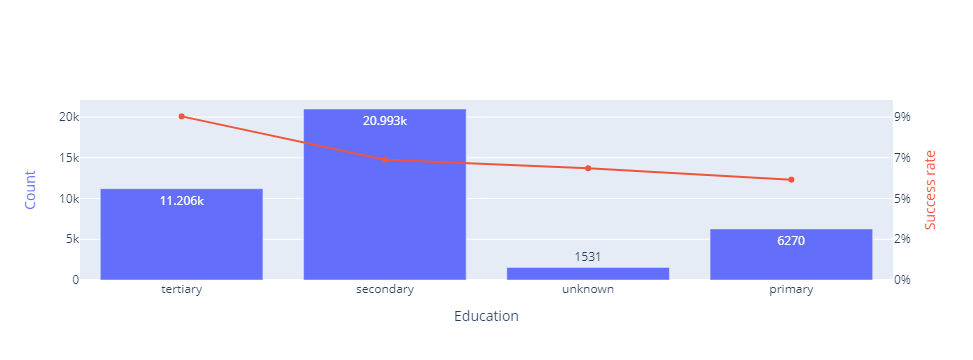

In [22]:
bar(df.education, df.y, feature_name="Education", target_average_name="Success rate")

We see that having tertiary education really improves the success rate of the deposits. It is probably due to the income level and to the job. We can take a look at the relationships of both variables:

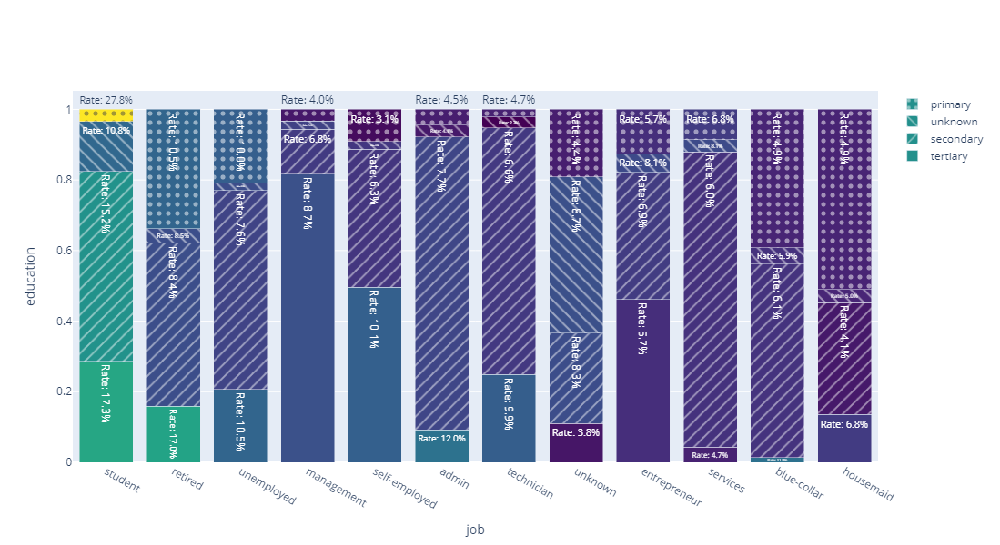

In [23]:
barchart_100_percent(df.job, df.education, df.y)

We see that indeed the deposits had more success among people with higher education level, but also that people with higher education level tend to also have jobs that themselves are better paid. Take a look at the top-right corner, with that big amount of people with only primary education that have jobs were deposits had lower success rate: blue-collar and housemaids.

Now let's take a look at the relationship with the marital status. We see that singles are generally the best educated.

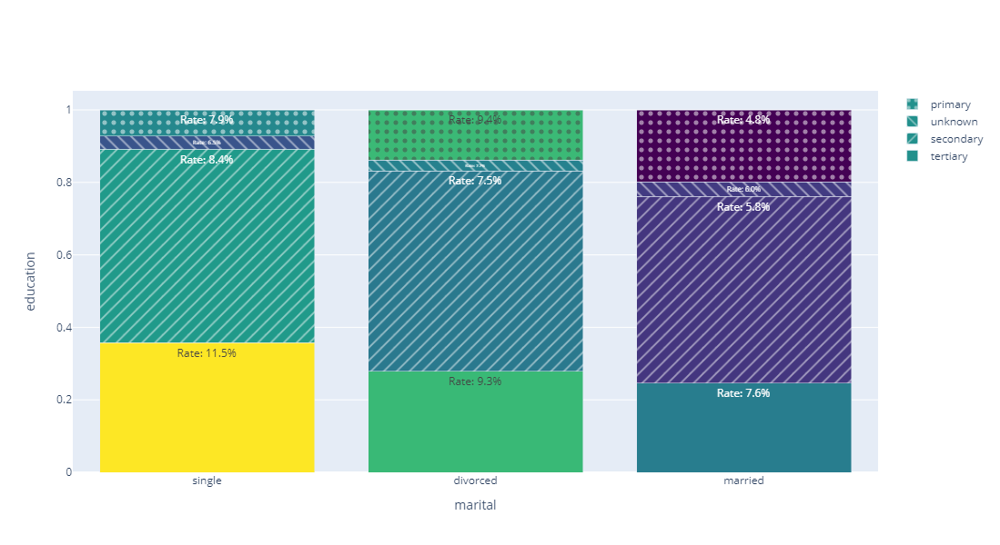

In [24]:
barchart_100_percent(df.marital, df.education, df.y)

## Default

In [25]:
df.default.unique()

array(['no', 'yes'], dtype=object)

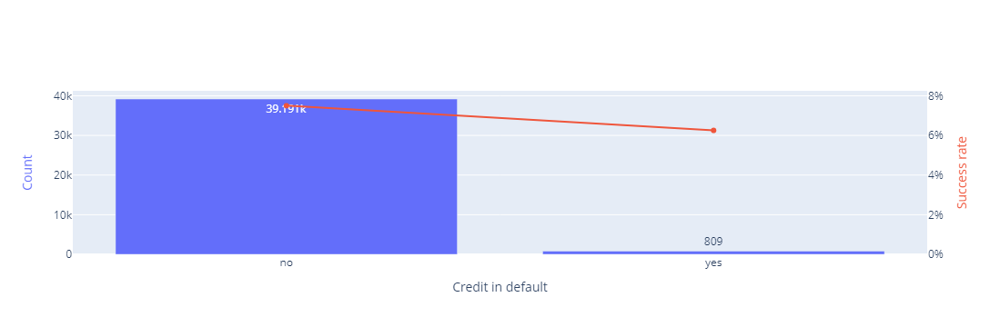

In [26]:
bar(df.default, df.y, feature_name="Credit in default", target_average_name="Success rate")

Of course having credit in default diminishes the probability of being interested in a term deposit.

The amount of people with default is so low compared to the size of the dataset that I don't think we should focus too much on it.

## Balance

This is a histogram where values lower or higher than 2 standard deviations from the mean have been clipped to those values:

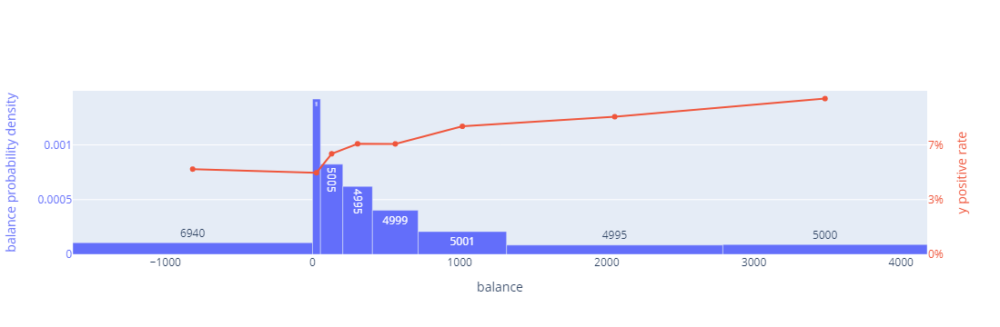

In [27]:
histogram(df, "balance", "y", clip_outliers_max_deviation=1, keep_group_size_constant=True)

We see that, for people with very small or negative balance, the success rate is just around 5%. However, when the balance increases, the probability of success also does.

Relating this to the job these people have, we see this:

In [28]:
def categorical_bar_chart_plus_violin(df, categorical_variable, violin_variable, category_order):
    def normalized_to_value(x: pd.Series, normalized_value):
        mu = x.mean()
        std = x.std()
        return normalized_value * std + mu
    
    
    categorical_frequency = df[categorical_variable].value_counts().reindex(category_order)
    
    return go.Figure(
        data=[
            go.Bar(
                x=categorical_frequency.index,
                y=categorical_frequency,
                name="Count",
                yaxis="y",
                showlegend=False,
            ),
            go.Violin(
                x=df[categorical_variable],
                y=df[violin_variable],
                width=1,
                fillcolor='lightseagreen',
                line_width=0,
                meanline = dict(color="black", width=2),
                points=False,
                showlegend=False,
                yaxis="y2",
            )
        ],
        layout=go.Layout(
            yaxis=dict(
                title="Count",
                titlefont=dict(
                    color=px.colors.qualitative.Plotly[0]
                ),
                side="left"
            ),
            yaxis2=dict(
                title=violin_variable,
                anchor="x",
                overlaying="y",
                side="right",
                titlefont_color="lightseagreen",
                tickmode="sync",
                range=[normalized_to_value(df[violin_variable], -2), normalized_to_value(df[violin_variable], 2)]
            ),
            height=500
        )
    )

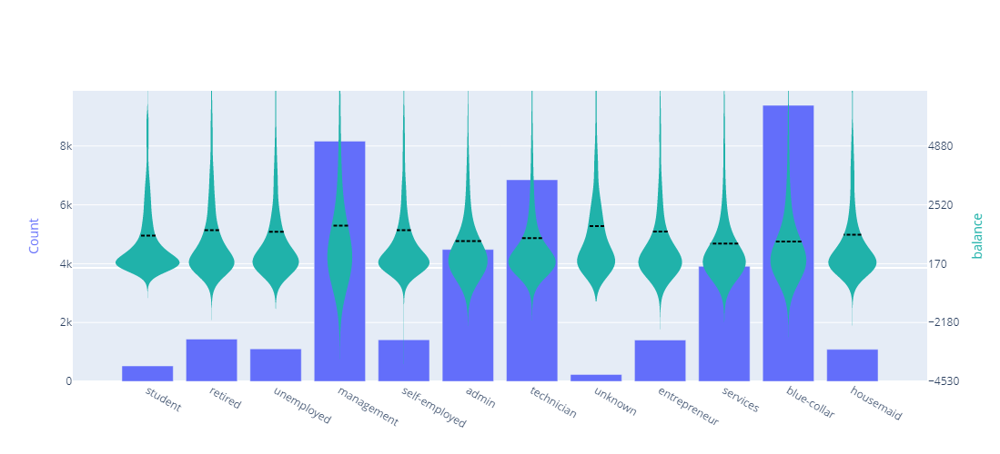

In [29]:
categorical_bar_chart_plus_violin(df, "job", "balance", df.groupby("job").y.mean().sort_values(ascending=False).index)

We are not seeing any particular difference. Maybe with a marimekko chart we see things more clearly:

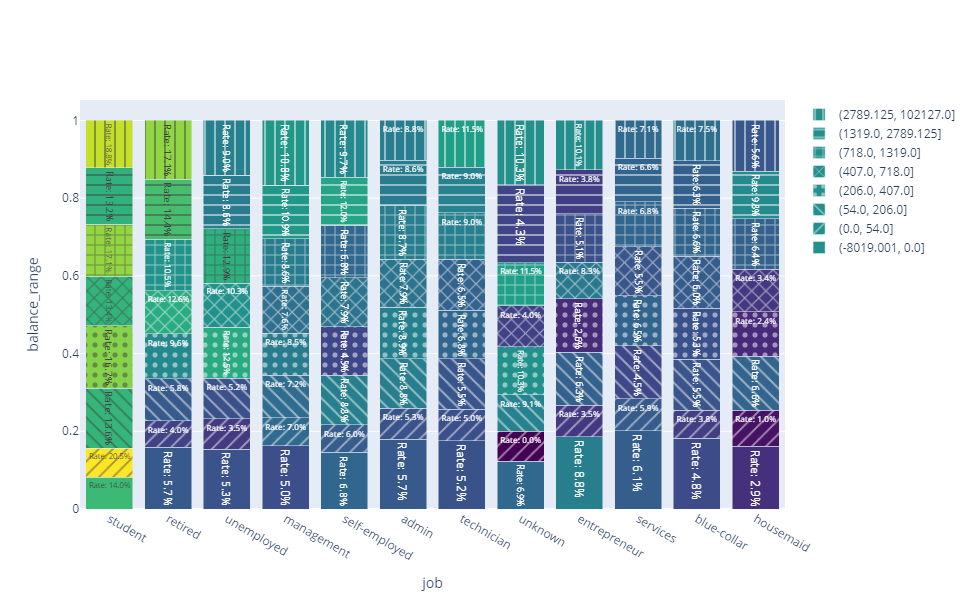

In [30]:
balance_range = pd.qcut(df.balance, q=8).map(str).rename("balance_range")
barchart_100_percent(df.job, balance_range, df.y)

## Housing

In [31]:
df.housing.value_counts()

yes    24031
no     15969
Name: housing, dtype: int64

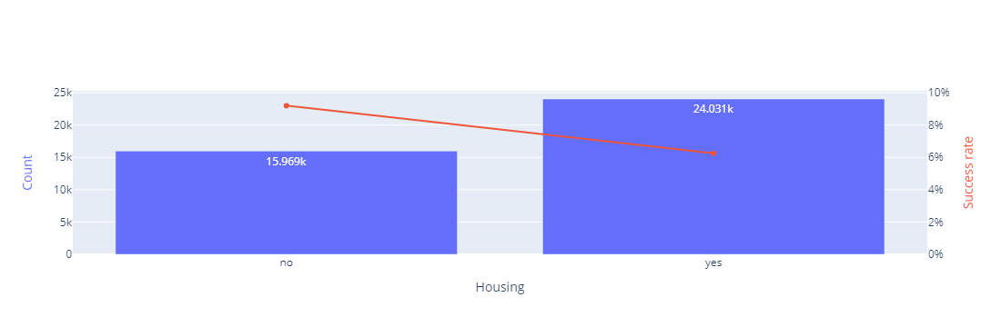

In [32]:
bar(df.housing, df.y, feature_name="Housing", target_average_name="Success rate")

This makes sense because people with a house are probably still paying the house, hence they need their money to be available.

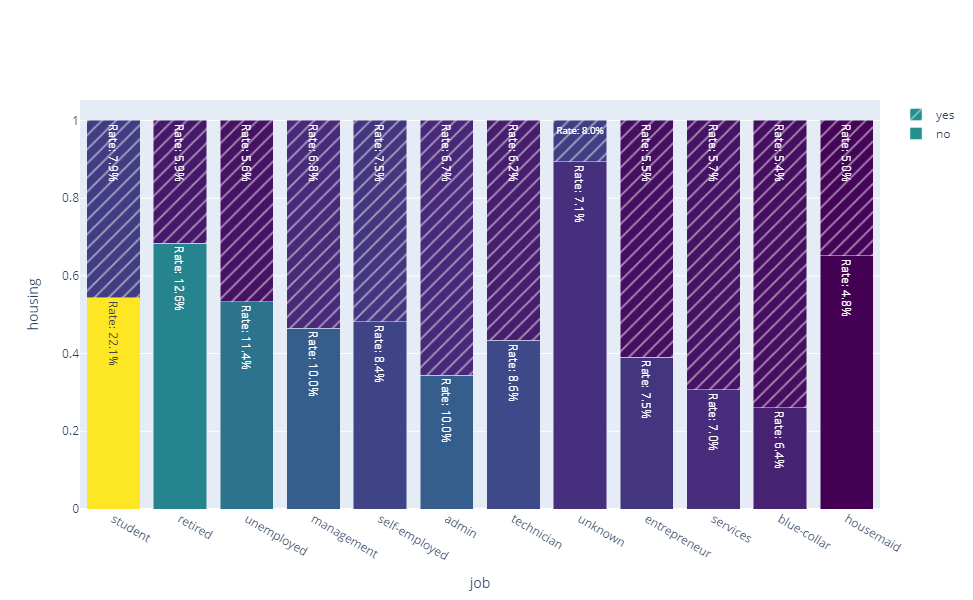

In [33]:
barchart_100_percent(df.job, df.housing, df.y)

## Loan

In [34]:
df.loan.value_counts()

no     33070
yes     6930
Name: loan, dtype: int64

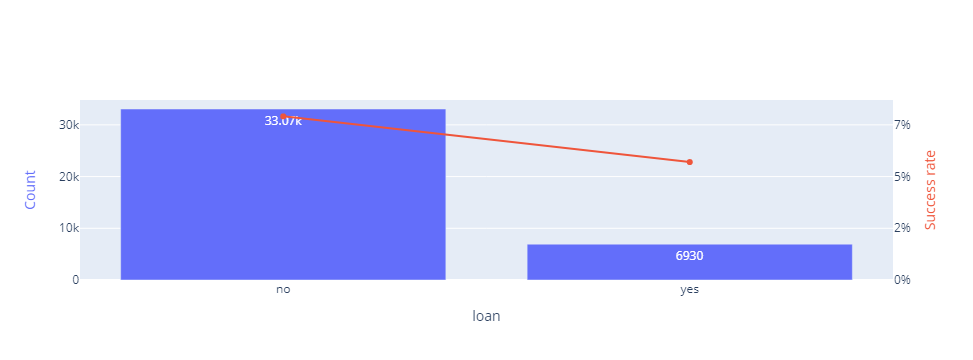

In [35]:
bar(df.loan, df.y, target_average_name="Success rate")

## Contact

In [36]:
df.contact.value_counts()

cellular     24914
unknown      12765
telephone     2321
Name: contact, dtype: int64

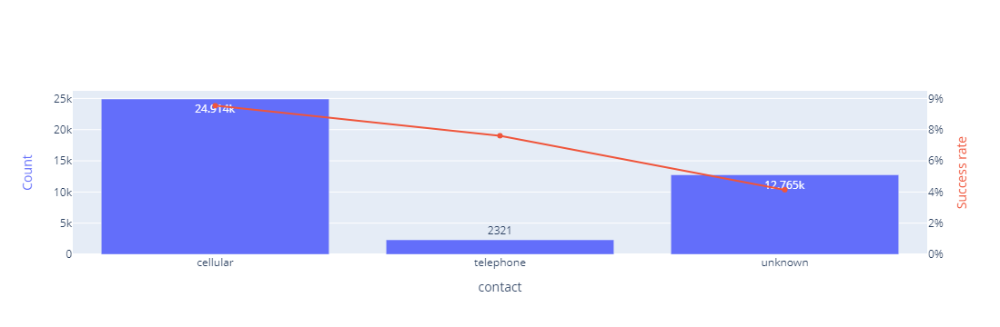

In [37]:
bar(df.contact, df.y, target_average_name="Success rate")

It seems contacting by cellular is the most effective way of doing it

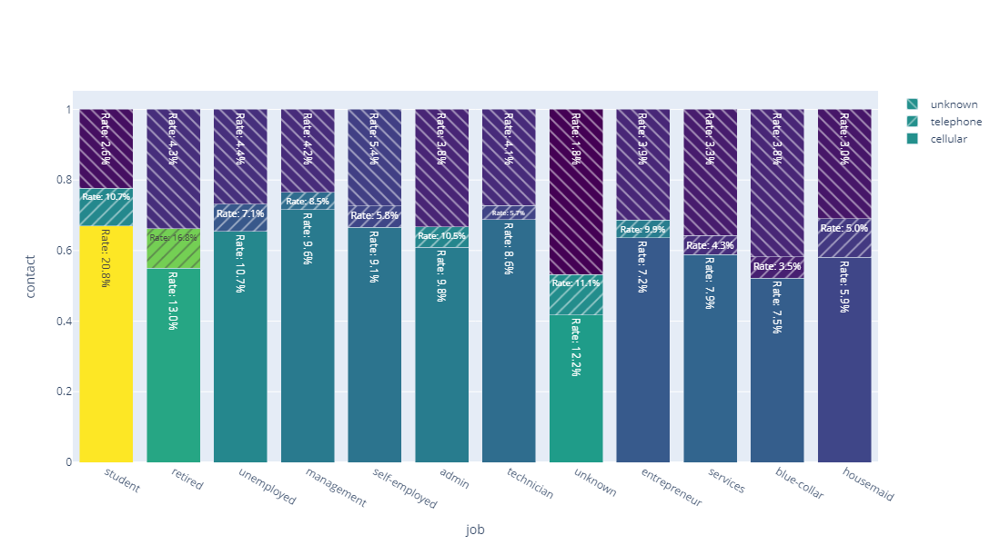

In [38]:
barchart_100_percent(df.job, df.contact, df.y)

## Day and month

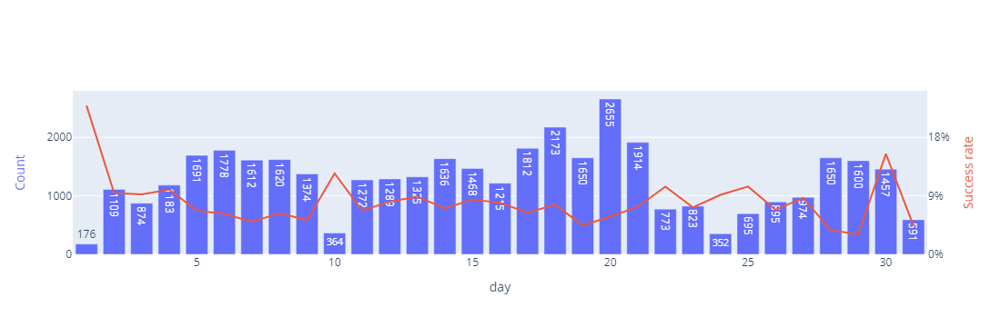

In [39]:
bar_numerical(df.day, df.y, target_average_name="Success rate")

With respect to the day of the month, we see there is an abnormally high success rate the first of the month, as well as the 30th.

In [40]:
month_index = df.month.replace(dict(
    jan=1,
    feb=2,
    mar=3,
    apr=4,
    may=5,
    jun=6,
    jul=7,
    aug=8,
    sep=9,
    oct=10,
    nov=11,
    dec=12
))

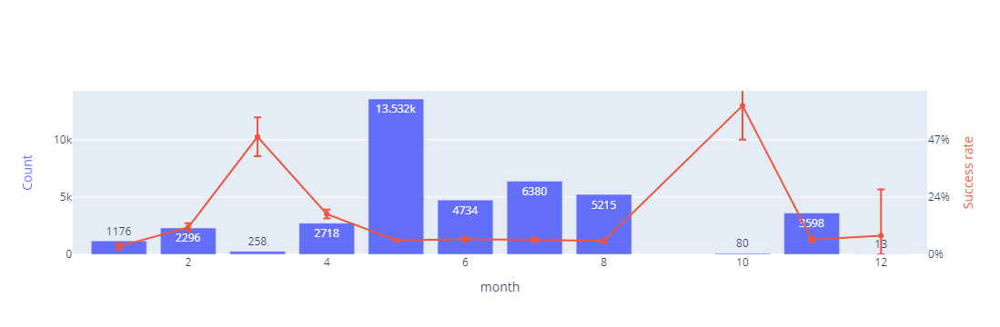

In [41]:
bar_numerical(month_index, df.y, target_average_name="Success rate", confidence_intervals_significance_level=0.01)

With respect to the month, we see abnormal peaks on march and october, but the number of samples is very small. What happened in these months that made them so high in success?

We can take a look at just the march and october data to see what is special about them:

In [42]:
def calculate_unexplained_partial_success_rate_increase(dist: ProbabilityDistribution, variable, given_variable, given_values):
    marg_prob = dist.get_marginal_probability(variable)
    marg_success_rate = dist.select_variables([variable, "y"]).conditioned_on(variable).given(y=True).distribution

    partial_dist = dist.given(**{given_variable: given_values})
    marg_prob_partial = partial_dist.get_marginal_probability(variable)
    marg_success_rate_partial = partial_dist.select_variables([variable, "y"]).conditioned_on(variable).given(y=True).distribution

    success_rate = dist.select_variables("y").get_marginal_probability("y").loc[True]
    expected_partial_success_rate = (marg_prob_partial * marg_success_rate).sum()
    partial_success_rate = partial_dist.select_variables("y").get_marginal_probability("y").loc[True]

    print(f"expected_partial_success_rate: {expected_partial_success_rate}")
    
    success_rate_expected_increase = expected_partial_success_rate - success_rate
    success_rate_unexplained_increase = partial_success_rate - expected_partial_success_rate
    unexplained_increase_proportion = success_rate_unexplained_increase / success_rate_expected_increase

    unexplained_increase_distribution = (marg_prob_partial * (marg_success_rate_partial - marg_success_rate)).transform(lambda s: s / s.sum())
    
    return unexplained_increase_proportion, unexplained_increase_distribution

In [43]:
dist = ProbabilityDistribution(df)
calculate_unexplained_partial_success_rate_increase(dist, "contact", "month", ["mar", "oct"])

expected_partial_success_rate: 0.08181802809644505


(45.97298573310383,
 contact
 cellular     0.659937
 telephone    0.230817
 unknown      0.109246
 dtype: float64)

Assuming that the data does not come from a leap year, we can group the days into 7 day intervals to see if there is any day of the week that is different from the rest:

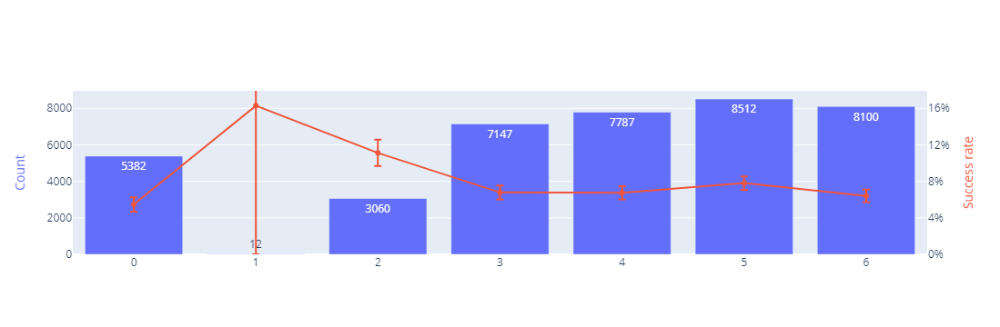

In [44]:
dates = pd.to_datetime(pd.concat([pd.Series(2022, index=df.index, name="year"), month_index, df.day], axis="columns"))
day_of_week = dates.dt.dayofweek
bar_numerical(day_of_week, df.y, target_average_name="Success rate", confidence_intervals_significance_level=0.01)

We do not see any signifcative difference any day of the week except for one day. The highest peak happened in a day with very few people contacted, so we are not going to take it into account. It was probably Sunday. However, it is strange the higher rate it happens on Mondays.

In [45]:
dist = ProbabilityDistribution(pd.concat([df, day_of_week.rename("day_of_week")], axis="columns"))
calculate_unexplained_partial_success_rate_increase(dist, "month", "day_of_week", 2)

expected_partial_success_rate: 0.10812579499399295


(0.15674095434480959,
 month
 apr   -3.191279
 aug         NaN
 dec         NaN
 feb   -1.405283
 jan         NaN
 jul         NaN
 jun    1.490767
 mar   -0.635937
 may    4.688401
 nov    0.043889
 oct    0.009441
 dtype: float64)

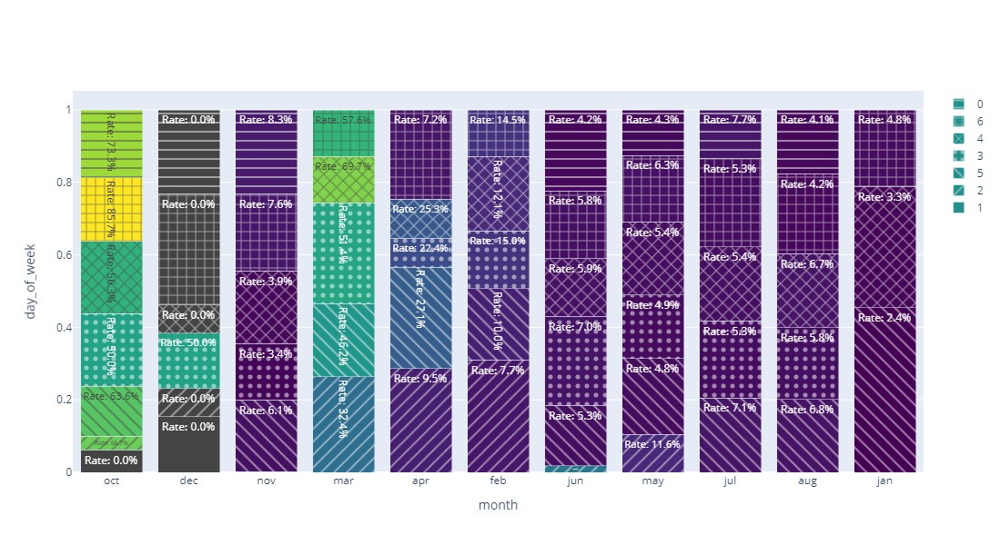

In [46]:
barchart_100_percent(df.month, day_of_week.rename("day_of_week"), df.y)

## Duration

In [47]:
pd.isnull(df.duration).any()

False

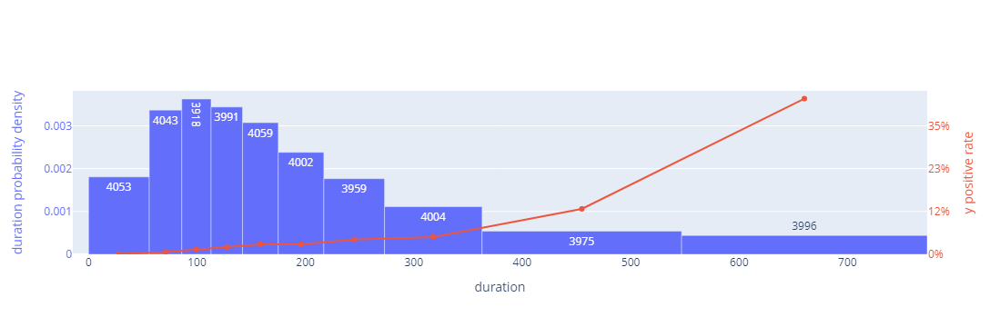

In [48]:
histogram(df, "duration", "y", number_of_bins=10, clip_outliers_max_deviation=2, keep_group_size_constant=True)

The higher the duration of the last contact, the more likey is the client to want the term deposit, which makes lots of sense.

## Campaign

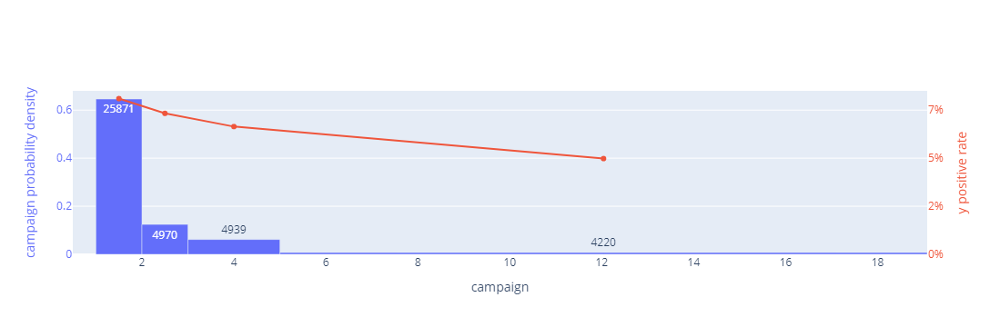

In [50]:
histogram(df, "campaign", "y", clip_outliers_max_deviation=5, number_of_bins=8, keep_group_size_constant=True)

This can be kind of counterintuitive. The more times the client is contacted, the lower the success rate. So, this graph suggests that we should not spend too much effort in contacting the same client again and again.

# Modeling

## Feature engineering
With the purpose of helping the classifier and to get more meaningful features, I am going to transform some features.

First of all, all continuous variables will be discretized into beans that make sense.

In [51]:
numerical_variables = df.dtypes == "int64"
df.columns[numerical_variables]

Index(['age', 'balance', 'day', 'duration', 'campaign'], dtype='object')

### Age

Let's take a look again at the chart for age

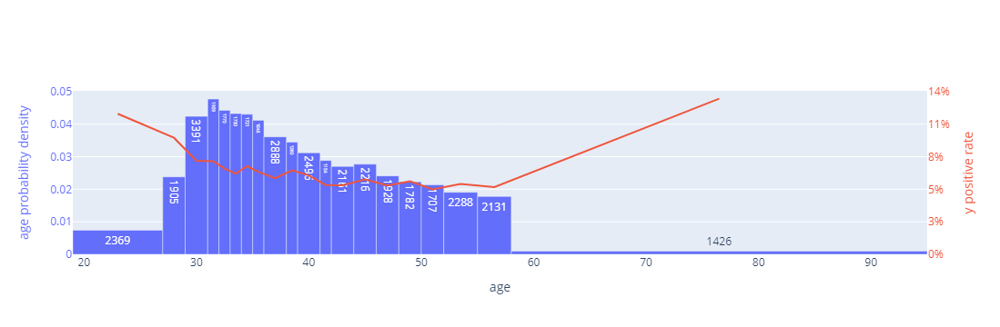

In [52]:
histogram(df, "age", "y", number_of_bins=20, keep_group_size_constant=True)

I think it makes sense to clearly distinguish a group for people under 25 and over 65. Then we can divide the rest in equal sized groups:

In [53]:
bins = [df.age.min(), 25, 35, 45, 55, 65, df.age.max()]
age_discretized = pd.cut(df.age, bins, include_lowest=True)

### Balance

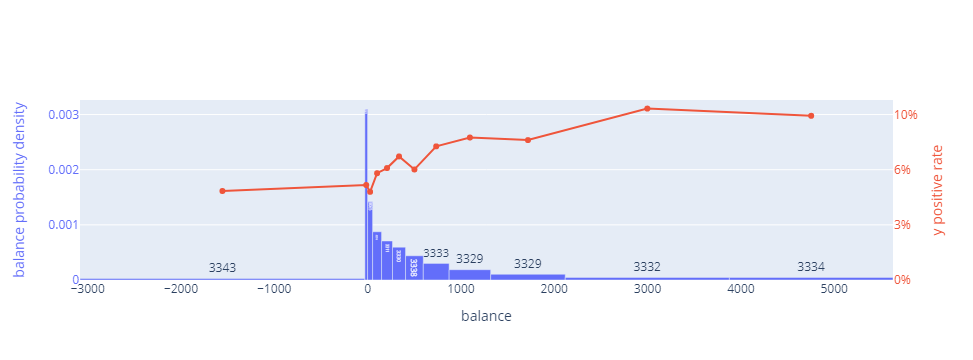

In [54]:
histogram(df, "balance", "y", number_of_bins=12, clip_outliers_max_deviation=1.5, keep_group_size_constant=True)

We cans see three main regions: the people that have less than 100 dollars, people that have over 2000, and the rest, whose success rate increases with money. Hence I propose a distribution like:

In [55]:
bins = [df.balance.min(), 100, 500, 1000, 2000, df.balance.max()]
balance_discretized = pd.cut(df.balance, bins, include_lowest=True)

### Duration of last call

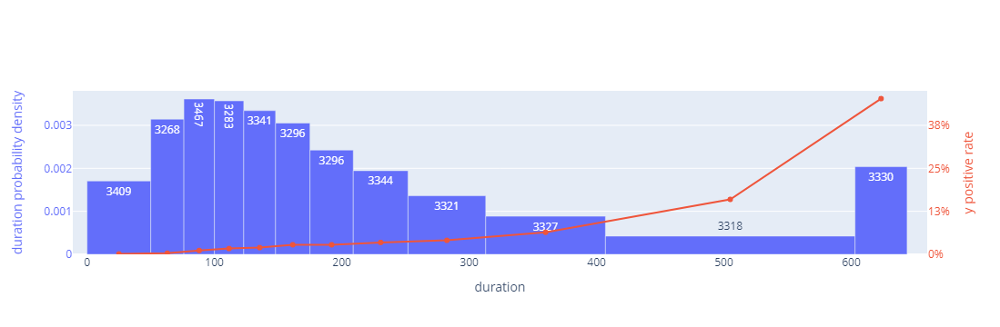

In [62]:
histogram(df, "duration", "y", number_of_bins=12, clip_outliers_max_deviation=1.5, keep_group_size_constant=True)

Here we see a continuous upward trend: the longer the call, the more likely it is to be successful. But, of course, this does not mean the causal relationship goes in that direction. It could be that, as the client is convinced, the call just tends to be longer.

The bins I will use are

In [64]:
bins = [df.duration.min(), 100, 200, 300, 400, 500, 600, df.duration.max()]
duration_discretized = pd.cut(df.duration, bins, include_lowest=True)

### Number of calls to client

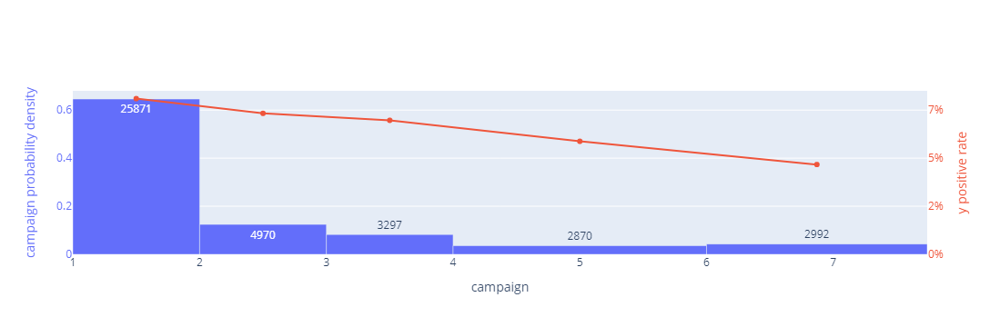

In [67]:
histogram(df, "campaign", "y", number_of_bins=12, clip_outliers_max_deviation=1.5, keep_group_size_constant=True)

Let's keep it simple here

In [68]:
bins = [1, 2, 4, 6, df.campaign.max()]
campaign_discretized = pd.cut(df.campaign, bins, include_lowest=True)

### Weekday

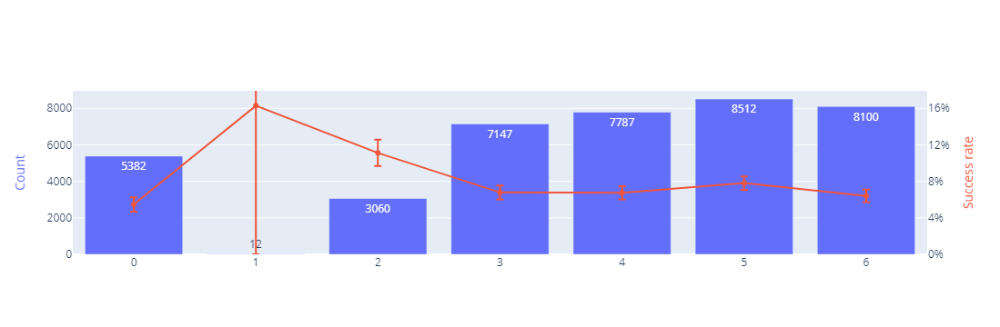

In [70]:
bar_numerical(day_of_week, df.y, target_average_name="Success rate", confidence_intervals_significance_level=0.01)

Here we will just apply a differentiation of whether it is Monday or not:

In [71]:
is_monday = day_of_week == 2

### All together

In [72]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'y'],
      dtype='object')

In [84]:
X = pd.concat([
    age_discretized.cat.codes.rename("age"),
    df.job,
    df.marital,
    df.education,
    df.default,
    balance_discretized.cat.codes.rename("balance"),
    df.housing,
    df.loan,
    df.contact,
    df.day,
    df.month,
    duration_discretized.cat.codes.rename("duration"),
    campaign_discretized.cat.codes.rename("campaign"),
    is_monday.rename("is_monday")
], axis="columns")

y = df.y

## Training

In [3]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, fbeta_score, make_scorer, mutual_info_score, \
    ConfusionMatrixDisplay, precision_score, recall_score, roc_curve
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, cross_val_score, cross_validate, \
    LeaveOneOut
from dataclasses import dataclass, make_dataclass, fields, asdict
from typing import Any, List
from collections import defaultdict

from model_evaluation import print_scores, register_scores, dataframe_from_estimator_scores, calculate_scores, estimators_scores, ModelEvaluationLaboratory
from model_training import optimize_hyperparameters

Prepare data

In [112]:
X = pd.get_dummies(X, columns=X.columns[(X.dtypes == "object") | (X.dtypes == "int8")])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

Define evaluation metrics

In [5]:
def specificity_score(y_true: pd.Series, y_pred: pd.Series):
    true_negatives = sum((y_true == False) & (y_pred == False))
    false_positives = sum((y_true == False) & (y_pred == True))
    return true_negatives / (true_negatives + false_positives)


metrics = dict(
    Accuracy=make_scorer(accuracy_score),
    F1=make_scorer(f1_score),
    ROC_AUC=make_scorer(roc_auc_score, needs_threshold=True),
    Precision=make_scorer(precision_score),
    Recall_Sensibility=make_scorer(recall_score),
    Specificity=make_scorer(specificity_score),
    beta_score=make_scorer(fbeta_score, beta=2)
)


eval_lab = ModelEvaluationLaboratory(
    metrics=dict(
        Accuracy=make_scorer(accuracy_score),
        F1=make_scorer(f1_score),
        ROC_AUC=make_scorer(roc_auc_score, needs_threshold=True),
        Precision=make_scorer(precision_score),
        Recall_Sensibility=make_scorer(recall_score),
        Specificity=make_scorer(specificity_score),
        beta_score=make_scorer(fbeta_score, beta=2)
    )
)

In [16]:
from inspect import signature

"y_score" in signature(roc_auc_score).parameters


True

In [17]:
signature(accuracy_score).parameters

mappingproxy({'y_true': <Parameter "y_true">,
              'y_pred': <Parameter "y_pred">,
              'normalize': <Parameter "normalize=True">,
              'sample_weight': <Parameter "sample_weight=None">})

In [18]:
signature(fbeta_score)

<Signature (y_true, y_pred, *, beta, labels=None, pos_label=1, average='binary', sample_weight=None, zero_division='warn')>

Create classifier

In [99]:
xgb_model = xgb.XGBClassifier(objective="binary:logistic", random_state=0, n_estimators=1000)

In [105]:
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=1000, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=0, ...)

In [109]:
training_scores, cross_validation_scores = print_scores(xgb_model, X_train, y_train, cross_validation=5)
register_scores("XGBoost over training", estimator=xgb_model, training_scores=training_scores, cross_validation_mean_scores=cross_validation_scores)

Optimize different parameters

In [106]:
# from scipy.stats import uniform, randint

# params = {
#     "colsample_bytree": uniform(0.7, 0.3),
#     "gamma": uniform(0, 0.5),
#     "learning_rate": uniform(0.03, 0.3),
#     "max_depth": randint(2, 6),
#     "subsample": uniform(0.6, 0.4)
# }

# xgb_optimized = optimize_hyperparameters(xgb_model, X_train, y_train, params, scoring=metrics["beta_score"], random=True, n_iter=10)


In [ ]:
training_scores, cross_validation_scores = print_scores(xgb_optimized, X_train, y_train, cross_validation=5)
register_scores("XGBoost optimized", estimator=xgb_optimized, training_scores=training_scores, cross_validation_mean_scores=cross_validation_scores)

# Evaluation

In [114]:
test_scores = calculate_scores(xgb_model, X_test, y_test)

In [117]:
register_scores("XGBoost over training", estimator=xgb_model, test_scores=test_scores)

In [118]:
dataframe_from_estimator_scores()

Training                                \
                       Accuracy        F1   ROC_AUC Precision   
Estimator                                                       
XGBoost over training  0.998437  0.989149  0.999971  0.996502   
XGBoost optimized           NaN       NaN       NaN       NaN   

                                                                 \
                      Recall_Sensibility Specificity beta_score   
Estimator                                                         
XGBoost over training           0.981904     0.99973    0.98479   
XGBoost optimized                    NaN         NaN        NaN   

                      Cross-validation                      ...  \
                              Accuracy        F1   ROC_AUC  ...   
Estimator                                                   ...   
XGBoost over training         0.925625  0.442388  0.925558  ...   
XGBoost optimized                  NaN       NaN       NaN  ...   

                                                                    Test  \
                      Recall_Sensibility Specificity beta_score Accuracy   
Estimator                                                                  
XGBoost over training           0.407136    0.966171   0.420435  0.92675   
XGBoost optimized                    NaN         NaN        NaN  0.92675   

                                                                        \
                             F1   ROC_AUC Precision Recall_Sensibility   
Estimator                                                                
XGBoost over training  0.444023  0.926716  0.488518           0.406957   
XGBoost optimized      0.444023  0.926716  0.488518           0.406957   

                                              
                      Specificity beta_score  
Estimator                                     
XGBoost over training    0.967003   0.421015  
XGBoost optimized        0.967003   0.421015  

[2 rows x 21 columns]

In [176]:
def ROC(y_true, y_score):
    false_positive_rate, true_positive_rate, _ = roc_curve(y_test, y_score)
    
    return go.Figure(
        go.Scatter(x=false_positive_rate, y=true_positive_rate),
        layout=go.Layout(
            width=500,
            height=500,
            xaxis_range=[0, 1],
            yaxis_range=[0, 1],
            title="ROC"
        )
    )

In [177]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, y_score)

In [173]:
recall = true_positive_rate

total_positive = sum(y_test)
total_negative = sum(~y_test)
true_positive = true_positive_rate * total_positive
false_positive = false_positive_rate * total_negative
precision = true_positive / (true_positive + false_positive)

beta_score = (1 + 0.5**2) * recall * precision / (0.5**2 * recall + precision)

C:\Users\chana\AppData\Local\Temp\ipykernel_10468\1346215302.py:7: RuntimeWarning:

invalid value encountered in divide



In [174]:
beta_opt_df = pd.DataFrame(dict(beta_score=pd.Series(beta_score), recall=recall, precision=precision, threshold=threshold))

In [175]:
beta_opt_df.sort_values("beta_score", ascending=False)

,beta_score,recall,precision,threshold
567,0.659751,0.829565,0.362738,0.018111
565,0.658915,0.827826,0.362805,0.018240
566,0.658550,0.827826,0.362253,0.018211
601,0.657545,0.860870,0.338115,0.009559
563,0.657238,0.824348,0.362940,0.018611
...,...,...,...,...
3,0.008677,0.006957,0.800000,0.999699
4,0.008673,0.006957,0.666667,0.999618
1,0.002173,0.001739,1.000000,0.999883
2,0.002172,0.001739,0.500000,0.999878


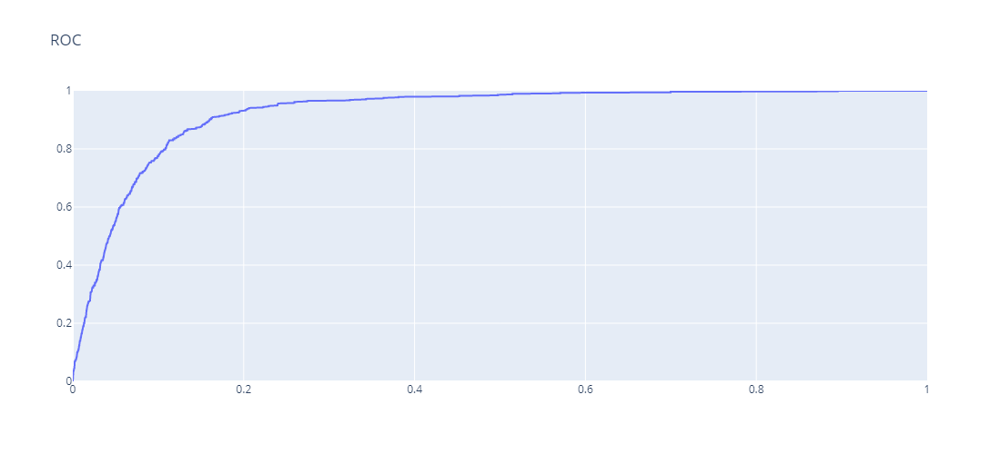

In [128]:
y_score = estimators_scores["XGBoost over training"].estimator.predict_proba(X_test)[:, 1]
ROC(y_test, y_score)

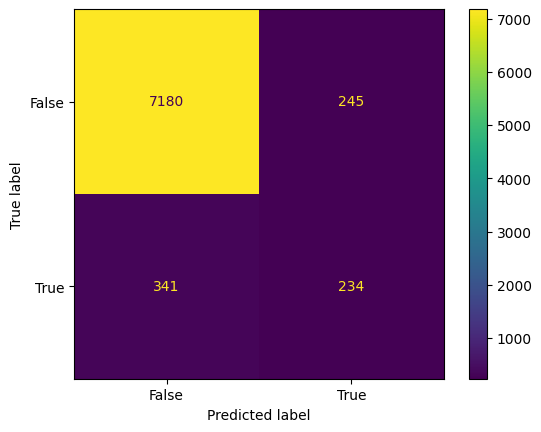

In [126]:
y_pred = estimators_scores["XGBoost over training"].estimator.predict(X_test)
ConfusionMatrixDisplay.from_predictions(y_test, y_pred)

,day,is_monday,age_0,age_1,age_2,age_3,age_4,age_5,job_admin,job_blue-collar,...,duration_1,duration_2,duration_3,duration_4,duration_5,duration_6,campaign_0,campaign_1,campaign_2,campaign_3
12836,7,False,0,1,0,0,0,0,1,0,...,1,0,0,0,0,0,1,0,0,0
10913,17,False,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
4214,19,False,0,0,1,0,0,0,0,1,...,1,0,0,0,0,0,0,1,0,0
8198,2,False,0,1,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,1
31403,26,False,0,0,1,0,0,0,1,0,...,1,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38220,15,False,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
7416,29,False,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8455,3,False,0,0,1,0,0,0,0,1,...,0,0,0,0,0,1,1,0,0,0
325,5,False,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0


In [ ]:
bar(X_test